# Capstone Project - The Battle of the Neighborhoods (Week 2)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: Business Problem <a name="introduction"></a>

In this project, we will try to find the best type of store for opening and its location. More specifically, it will be useful for stakeholders looking to open a store in Houston. Since the city is large, there are many venues in it. There are different neighborhoods in it in terms of living standards. Therefore, what exactly to open a store and where you want to find out. It is interesting to know where wealthy people live and which store can be opened as close as possible to them. We will use knowledge gained in specialization and data from open sources to try to solve this problem.

## Data <a name="data"></a>

In accordance with the problem under consideration, we will be interested in the following factors:
- prevalence of certain types of shops in the city
- the location of these stores
- areas with wealthy residents
- type of store to open
- approximate store location

centers of candidate areas will be generated algorithmically and approximate addresses of centers of those areas will be obtained using Google Maps API reverse geocoding
number of venues and their type and location in every neighborhood will be obtained using Foursquare API
coordinate of Houston center will be obtained using Google Maps API geocoding of well known Houston Center


## Methodology <a name="methodology"></a>

In this project, we will investigate Houston for the possibility of opening a store and identify an approximate area in which to do so. The city is located in Texas and has about 2 million inhabitants. In the first step, we will collect data to describe the city at the district level. We will also collect data on venuses located in this city in order to determine where the density of vents is higher and there is a demand and an opportunity to discover a new one. Next, we will only work with data for all stores to determine the density of stores in the city and find a niche. Next, we will find common patterns between areas in order to determine the approximate contingent of our clients. We will use two types of clustering to make sure that the clusters reflect common patterns. For this, we use the KMeans and Agglomerative Clustering algorithms. Finally, we will narrow down the category of stores that can be opened in one of the districts of these clusters. We will then use the data for the wealthiest neighborhoods in the city to find neighborhoods where customers can afford to shop in our store. As a result, we will get the approximate location of the store and the type of store that have development prospects.

## Analysis <a name="analysis"></a>

### 1. Displaying city neighbourhoods

Let's build a city map with neighbourhoods.

In [149]:
!pip install geocoder

import pandas as pd
import numpy as np
import folium

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import geocoder # to get coordinates

Let's define the existing areas. Geodata for the city can be found here: https://github.com/codeforamerica/click_that_hood/blob/master/public/data/houston.geojson

In [150]:
geo_json = pd.read_json('houston.geojson')


i = 0
nbh = []
while i < 88:
    nbh.append(geo_json['features'][i]['properties']['name'])
    i += 1
nbh

['Fourth Ward',
 'Greater Uptown',
 'Greater Inwood',
 'Greater Hobby Area',
 'Eldridge / West Oaks',
 'Washington Avenue Coalition / Memorial Park',
 'Pleasantville Area',
 'Northshore',
 'Minnetex',
 'Spring Branch East',
 'Spring Branch North',
 'Langwood',
 'Greater Greenspoint',
 'Iah / Airport Area',
 'Kingwood Area',
 'Lake Houston',
 'South Belt / Ellington',
 'Ost / South Union',
 'Meadowbrook / Allendale',
 'Museum Park',
 'Greenway / Upper Kirby Area',
 'Mid West',
 'Midtown',
 'Edgebrook Area',
 'Memorial',
 'Settegast',
 'Addicks Park Ten',
 'Second Ward',
 'Independence Heights',
 'Downtown',
 'Westbranch',
 'Clinton Park Tri-Community',
 'Golfcrest / Bellfort / Reveille',
 'Greater Fifth Ward',
 'Denver Harbor / Port Houston',
 'Lazy Brook / Timbergrove',
 'Greater Heights',
 'Kashmere Gardens',
 'Northside Village',
 'Sharpstown',
 'El Dorado / Oates Prairie',
 'Westbury',
 'Spring Branch Central',
 'Hunterwood',
 'Willow Meadows / Willowbend Area',
 'Central Northwest'

Let's set the function of determining the coordinates of the regions and get the coordinates

In [151]:
# define a function to get coordinates
def get_latlng(neighborhood):
    # initialize your variable to None
    lat_lng_coords = None
    # loop until you get the coordinates
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}, Houston, USA'.format(neighborhood))
        lat_lng_coords = g.latlng
    return lat_lng_coords

In [7]:
# call the function to get the coordinates, store in a new list using list comprehension
lat_lon = [get_latlng(x) for x in nbh]

Let's create a dataframe based on the received data

In [8]:
df = pd.DataFrame(lat_lon, columns=['Latitude', 'Longitude'])
df.insert(loc=0, column='Neighbourhood', value=nbh)

df

,Neighbourhood,Latitude,Longitude
0,Fourth Ward,29.75762,-95.38449
1,Greater Uptown,29.76015,-95.47671
2,Greater Inwood,29.86977,-95.48044
3,Greater Hobby Area,29.62949,-95.27848
4,Eldridge / West Oaks,29.75795,-95.63097
...,...,...,...
83,Meyerland Area,29.67944,-95.47349
84,Magnolia Park,29.73228,-95.29223
85,Afton Oaks / River Oaks Area,29.75190,-95.43282
86,Briarforest Area,29.74768,-95.57424


Add the neighbourhood ID to be displayed on the map in color

In [41]:
df.insert(loc=3, value=pd.factorize(df['Neighbourhood'])[0], column='NeighbourhoodID')
df

,Neighbourhood,Latitude,Longitude,NeighbourhoodID
0,Fourth Ward,29.75762,-95.38449,0
1,Greater Uptown,29.76015,-95.47671,1
2,Greater Inwood,29.86977,-95.48044,2
3,Greater Hobby Area,29.62949,-95.27848,3
4,Eldridge / West Oaks,29.75795,-95.63097,4
...,...,...,...,...
83,Meyerland Area,29.67944,-95.47349,83
84,Magnolia Park,29.73228,-95.29223,84
85,Afton Oaks / River Oaks Area,29.75190,-95.43282,85
86,Briarforest Area,29.74768,-95.57424,86


In [152]:
# df.to_csv('df.csv', index=False)
df = pd.read_csv('df.csv')

Draw the map using a choropleth layer to color the areas with their centers.

In [153]:
houston_map = folium.Map(location = [29.7633, -95.3633], zoom_start=11)

folium.Choropleth(
    geo_data='houston.geojson',
    data=df,
    columns=['Neighbourhood','NeighbourhoodID'],
    key_on='properties.name',
    fill_color='Paired',
    fill_opacity=0.5,
    legend_name="Neighborhoods of Houston",
    line_opacity=0.2,
    threshold_scale=12,
    highligth=True
    ).add_to(houston_map)

for lat, lon, nb in zip(df['Latitude'], df['Longitude'], df['Neighbourhood']):
    folium.CircleMarker(
        tooltip=nb,
        location=[lat, lon],
        popup=f'{nb}',
        radius=5,
        color='grey',
        fill_color='grey',
        fill=True,
        fill_opacity=0.4,
        opacity=0.4
    ).add_to(houston_map)

folium.CircleMarker(
    popup=f'Houston Center',
    tooltip=f'Houston Center',
    location=[29.7564, -95.3632],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(houston_map)

folium.CircleMarker(
    popup=f'Houston Center',
    tooltip=f'Houston Center',
    location=[29.7564, -95.3632],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(houston_map)


houston_map.save('houston_map.html')
houston_map

In [1]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url="https://raw.githubusercontent.com/poop-hub/Coursera_Capstone/main/png/houston_map.png")

It can be seen that the city center is slightly shifted relative to the tinted area of the districts. The city has a large number of districts, so it is necessary to determine which establishments are located in them and where.

### 2. Loading nearby venues

Now let's load the nearest venues in each neighbourhood from Foursquare. So we can determine the approximate distribution of venues in the city.

In [154]:
CLIENT_ID = '***' # your Foursquare ID
CLIENT_SECRET = '***' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100

In [19]:
import requests

def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood',
                  'Neighbourhood Latitude',
                  'Neighbourhood Longitude',
                  'Venue',
                  'Venue Latitude',
                  'Venue Longitude',
                  'Venue Category']
    
    return(nearby_venues)

We will receive geodata within a radius of 2 km from the centers of neighbourhoods

In [20]:
# Get data from Foursquare API
ven_df = getNearbyVenues(
    names=df['Neighbourhood'],
    latitudes=df['Latitude'],
    longitudes=df['Longitude'],
    radius=2000)

Fourth Ward
Greater Uptown
Greater Inwood
Greater Hobby Area
Eldridge / West Oaks
Washington Avenue Coalition / Memorial Park
Pleasantville Area
Northshore
Minnetex
Spring Branch East
Spring Branch North
Langwood
Greater Greenspoint
Iah / Airport Area
Kingwood Area
Lake Houston
South Belt / Ellington
Ost / South Union
Meadowbrook / Allendale
Museum Park
Greenway / Upper Kirby Area
Mid West
Midtown
Edgebrook Area
Memorial
Settegast
Addicks Park Ten
Second Ward
Independence Heights
Downtown
Westbranch
Clinton Park Tri-Community
Golfcrest / Bellfort / Reveille
Greater Fifth Ward
Denver Harbor / Port Houston
Lazy Brook / Timbergrove
Greater Heights
Kashmere Gardens
Northside Village
Sharpstown
El Dorado / Oates Prairie
Westbury
Spring Branch Central
Hunterwood
Willow Meadows / Willowbend Area
Central Northwest
Trinity / Houston Gardens
Braeburn
Carverdale
South Main
Eastex - Jensen Area
Medical Center Area
East Houston
Acres Home
Northside/Northline
Hidden Valley
East Little York / Homeste

In [155]:
# ven_df.to_csv('Houston Venues.csv', index=False)
ven_df = pd.read_csv('Houston Venues.csv')

Display the resulting dataset with neighbourhoods

In [156]:
ven_df

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Fourth Ward,29.75762,-95.38449,Lucio's BYOB,29.758326,-95.385591,Bar
1,Fourth Ward,29.75762,-95.38449,Eleanor Tinsley Park,29.761440,-95.379271,Park
2,Fourth Ward,29.75762,-95.38449,Pat Greer's Kitchen,29.755708,-95.387013,Vegetarian / Vegan Restaurant
3,Fourth Ward,29.75762,-95.38449,Barnaby's Cafe,29.753470,-95.387019,American Restaurant
4,Fourth Ward,29.75762,-95.38449,Oporto Fooding House & Wine,29.753179,-95.380243,Portuguese Restaurant
...,...,...,...,...,...,...,...
4881,Neartown - Montrose,29.74281,-95.39728,Sorrento Ristorante,29.744433,-95.387042,Italian Restaurant
4882,Neartown - Montrose,29.74281,-95.39728,The Teahouse,29.741350,-95.410378,Bubble Tea Shop
4883,Neartown - Montrose,29.74281,-95.39728,The Patio on Richmond,29.734293,-95.394421,Bar
4884,Neartown - Montrose,29.74281,-95.39728,Avant Garden,29.744327,-95.386506,Bar


We received a large number of venues with their coordinates and categories to which they belong. Now let's see how it looks on the map.

In [157]:
houston_venue_map = folium.Map(location = [29.7633, -95.3633], zoom_start=13)

def style_function(feature):
    return { 'color': 'grey', 'fill': False }

folium.GeoJson('houston.geojson', style_function=style_function, name='geojson').add_to(houston_venue_map)

for lat, lon, ven in zip(ven_df['Venue Latitude'], ven_df['Venue Longitude'], ven_df['Venue']):
    label = '{}'.format(ven)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7).add_to(houston_venue_map)

folium.Circle(
    radius=100,
    location=[29.7564, -95.3632],
    popup=f'Houston Center',
    color='black',
    fill=False,
).add_to(houston_venue_map)

houston_venue_map.save('houston_venue_map.html')
houston_venue_map

In [2]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url="https://raw.githubusercontent.com/poop-hub/Coursera_Capstone/main/png/houston_venue_map.png")

It seems the streets flooded hundreds of zombies! It can be seen that the venues are unevenly distributed in the city. Most of them are concentrated in the center and southwest. It can be seen that some streets are very densely filled, while others are empty.

### 3. Analysis of prevalence stores

Great, now we know where the venues are located. Now it is necessary to analyze which stores are present in the city. This way we can find out what type of stores can be opened with more confidence in success. To do this, we will find all the stores.

Now we will find in the data only the venues of interest to us, namely the different types of stores that can be found in the dataset.

In [158]:
shop_types = ['grocery', 'store', 'market', 'shop', 'mall']

In [159]:
columns = ven_df['Venue Category'].to_list()

shops = set()

for tp in shop_types:
    for col in columns:
        if tp in col.lower():
            shops.add(col)
shops

{'Accessories Store',
 'Antique Shop',
 'Arts & Crafts Store',
 'Auto Workshop',
 'Automotive Shop',
 'Bagel Shop',
 'Beer Store',
 'Big Box Store',
 'Bike Shop',
 'Bookstore',
 'Bridal Shop',
 'Bubble Tea Shop',
 'Camera Store',
 'Candy Store',
 'Cheese Shop',
 'Chocolate Shop',
 'Clothing Store',
 'Coffee Shop',
 'Comic Shop',
 'Convenience Store',
 'Cosmetics Shop',
 'Costume Shop',
 'Cupcake Shop',
 'Department Store',
 'Dessert Shop',
 'Discount Store',
 'Donut Shop',
 'Duty-free Shop',
 'Electronics Store',
 'Fabric Shop',
 'Farmers Market',
 'Flea Market',
 'Flower Shop',
 'Food & Drink Shop',
 'Frozen Yogurt Shop',
 'Fruit & Vegetable Store',
 'Furniture / Home Store',
 'Gift Shop',
 'Gourmet Shop',
 'Grocery Store',
 'Gun Shop',
 'Hardware Store',
 'Hobby Shop',
 'Ice Cream Shop',
 'Jewelry Store',
 'Kids Store',
 'Kitchen Supply Store',
 'Lingerie Store',
 'Liquor Store',
 'Market',
 'Mattress Store',
 "Men's Store",
 'Miscellaneous Shop',
 'Mobile Phone Shop',
 'Motorcycle S

Finding the prevalence of shops in the city

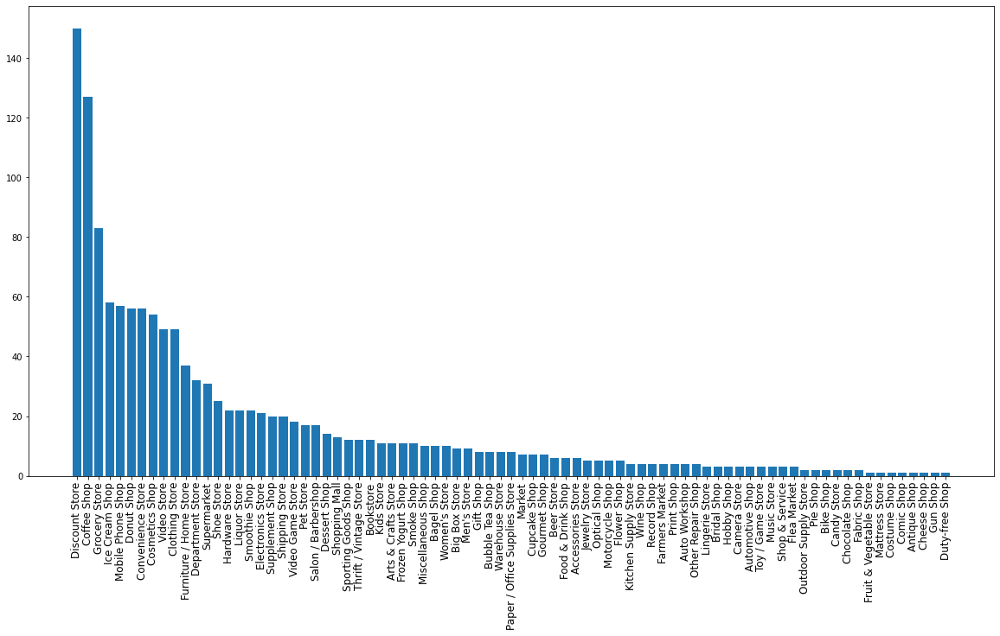

In [160]:
shop_counts = ven_df[ven_df['Venue Category'].isin(shops)]['Venue Category'].value_counts()

plt.figure(figsize=(20, 10))
plt.bar(range(len(shop_counts)), shop_counts.values, align='center')
plt.yticks(size='medium')
plt.xticks(range(len(shop_counts)), shop_counts.index.values, size='large', rotation=90)
plt.show()

The most common shops in the city:

Discount Store, Coffee Shop, Grocery Store, Ice Cream Store, Mobile Phone Store, Donut Store

Indirectly, it can be argued that these stores are popular with city residents. Therefore, opening one of these stores can be successful. There are two options: expanding the existing network of such stores or creating a new one.

### 4. Identifying patterns in similar areas

Now it is necessary to perform a cluster analysis of the areas in which the stores are located. We will use two clustering algorithms for the top and bottom pass to be more sure that such clusters are really similar to each other. In this case, it is necessary that the number of clusters coincide. We will use KMeans and Agglomerative Clustering algorithms. First, we transform the dataset.

In [164]:
ven_shop_df = ven_df[ven_df['Venue Category'].isin(shops)]
ven_shop_df

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
6,Fourth Ward,29.75762,-95.38449,Michael Saldana Salon,29.752019,-95.381208,Cosmetics Shop
15,Fourth Ward,29.75762,-95.38449,Texas Art Supply,29.750727,-95.391822,Arts & Crafts Store
20,Fourth Ward,29.75762,-95.38449,"Spec's Wines, Spirits & Finer Foods",29.748694,-95.376949,Liquor Store
21,Fourth Ward,29.75762,-95.38449,Inversion Coffee House,29.751469,-95.392039,Coffee Shop
24,Fourth Ward,29.75762,-95.38449,Catalina Coffee,29.767968,-95.380662,Coffee Shop
...,...,...,...,...,...,...,...
4869,Neartown - Montrose,29.74281,-95.39728,D & Q - The Beer Station,29.734774,-95.389106,Beer Store
4871,Neartown - Montrose,29.74281,-95.39728,Hot Bagel Shop,29.747799,-95.410576,Bagel Shop
4875,Neartown - Montrose,29.74281,-95.39728,Trader Joe's,29.739137,-95.411361,Grocery Store
4882,Neartown - Montrose,29.74281,-95.39728,The Teahouse,29.741350,-95.410378,Bubble Tea Shop


In [166]:
df_shop_oh = pd.get_dummies(ven_shop_df['Venue Category'], prefix="", prefix_sep="")
df_shop_oh['Neighbourhood'] = ven_df['Neighbourhood']
df_shop_gpd = df_shop_oh.groupby("Neighbourhood").mean().reset_index()
df_shop_gpd

,Neighbourhood,Accessories Store,Antique Shop,Arts & Crafts Store,Auto Workshop,Automotive Shop,Bagel Shop,Beer Store,Big Box Store,Bike Shop,Bookstore,Bridal Shop,Bubble Tea Shop,Camera Store,Candy Store,Cheese Shop,Chocolate Shop,Clothing Store,Coffee Shop,Comic Shop,Convenience Store,Cosmetics Shop,Costume Shop,Cupcake Shop,Department Store,Dessert Shop,Discount Store,Donut Shop,Duty-free Shop,Electronics Store,Fabric Shop,Farmers Market,Flea Market,Flower Shop,Food & Drink Shop,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gift Shop,Gourmet Shop,...,Hardware Store,Hobby Shop,Ice Cream Shop,Jewelry Store,Kids Store,Kitchen Supply Store,Lingerie Store,Liquor Store,Market,Mattress Store,Men's Store,Miscellaneous Shop,Mobile Phone Shop,Motorcycle Shop,Music Store,Optical Shop,Other Repair Shop,Outdoor Supply Store,Paper / Office Supplies Store,Pet Store,Pie Shop,Print Shop,Record Shop,Salon / Barbershop,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Smoke Shop,Smoothie Shop,Sporting Goods Shop,Supermarket,Supplement Shop,Thrift / Vintage Store,Toy / Game Store,Video Game Store,Video Store,Warehouse Store,Wine Shop,Women's Store
0,Acres Home,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.00,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.500000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Afton Oaks / River Oaks Area,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.00,0.0,0.0,0.026316,0.026316,0.0,0.000000,0.0,0.000000,0.078947,0.052632,0.0,0.000000,0.078947,0.0,0.026316,0.000000,0.00,0.000000,0.052632,0.0,0.026316,0.0,0.0,0.000000,0.000000,0.000000,0.026316,0.0,0.131579,0.026316,0.026316,...,0.000000,0.000000,0.026316,0.000000,0.000000,0.026316,0.000000,0.000000,0.026316,0.0,0.052632,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.026316,0.0,0.0,0.0,0.078947,0.000000,0.000000,0.0,0.026316,0.000000,0.026316,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.131579
2,Alief,0.000000,0.0,0.083333,0.0,0.0,0.000000,0.000000,0.00,0.0,0.0,0.000000,0.083333,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.083333,0.000000,0.0,0.000000,0.000000,0.00,0.166667,0.166667,0.0,0.000000,0.0,0.0,0.000000,0.083333,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.083333,0.0,0.000000,0.0,0.083333,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000
3,Astrodome Area,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.00,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.222222,0.0,0.111111,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.222222,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.111111,0.000000,0.0,0.000000,0.111111,0.111111,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Braeburn,0.000000,0.0,0.000000,0.0,0.0,0.052632,0.000000,0.00,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.105263,0.000000,0.0,0.000000,0.000000,0.00,0.210526,0.105263,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.052632,0.000000,0.0,0.000000,0.000000,0.052632,...,0.000000,0.000000,0.052632,0.000000,0.000000,0.000000,0.000000,0.052632,0.000000,0.0,0.000000,0.

Let's write the dataset into a variable for clustering algorithms

In [167]:
X = df_shop_gpd.drop('Neighbourhood', axis=1)
X.shape

(86, 81)

Train the model and find the best clustering

In [168]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score

# score list
k_list = []

km = KMeans(random_state=9)
 
# find best splitting
for k in range(2, 30):
  km.set_params(n_clusters=k)
  km.fit(X)
  k_list.append(davies_bouldin_score(X, km.labels_))

k_list

[1.4780585069894663,
 1.066687782201926,
 1.508799751554377,
 1.1072593173520455,
 1.0628337323517487,
 1.3918384120325467,
 1.1513717430431862,
 1.4834177755022613,
 1.294923336198808,
 1.239159729574399,
 1.3129511969510963,
 1.339239306678714,
 1.2884170922748104,
 1.213718521411612,
 1.166823689254986,
 1.2012033384087464,
 1.2206489263241653,
 1.1536708457906892,
 1.082633804166578,
 1.104279910763798,
 1.0527231875287575,
 1.0431271654962964,
 1.0544713591907744,
 1.0273507123727361,
 1.05758526501393,
 1.0901228579141498,
 1.0938063090211183,
 1.0699718173037418]

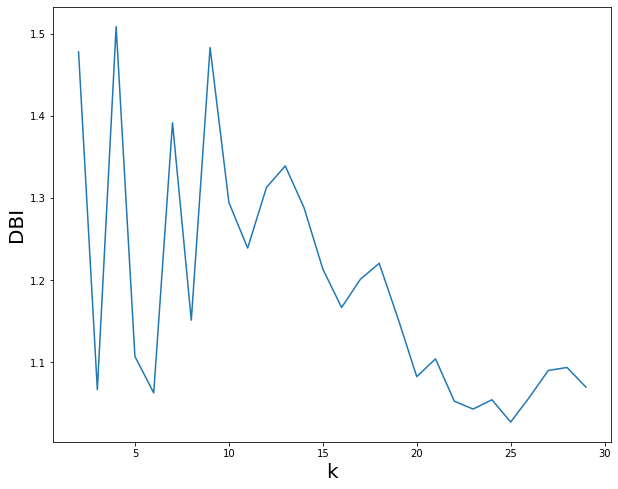

In [169]:
plt.figure(figsize=(10,8))

plt.xlabel('k', fontsize='20')
plt.ylabel('DBI', fontsize='20')

plt.plot(range(2, 30), k_list);

In [170]:
km_k = k_list.index(min(k_list[:9])) + 2
km_k

6

In [171]:
km = KMeans(km_k, random_state=0).fit(X)
km.score(X)

-6.23620589693113

Add labels to the dataset

In [173]:
df = df[df['Neighbourhood'].isin(df_shop_gpd['Neighbourhood'])].reset_index(drop=True)
df['kmLabels'] = km.labels_
df

,Neighbourhood,Latitude,Longitude,NeighbourhoodID,kmLabels
0,Fourth Ward,29.75762,-95.38449,0,0
1,Greater Uptown,29.76015,-95.47671,1,1
2,Greater Inwood,29.86977,-95.48044,2,5
3,Greater Hobby Area,29.62949,-95.27848,3,1
4,Eldridge / West Oaks,29.75795,-95.63097,4,5
...,...,...,...,...,...
81,Meyerland Area,29.67944,-95.47349,83,5
82,Magnolia Park,29.73228,-95.29223,84,1
83,Afton Oaks / River Oaks Area,29.75190,-95.43282,85,5
84,Briarforest Area,29.74768,-95.57424,86,5


Displaying a map with clusters

In [174]:
c_map = folium.Map(location = [29.7633, -95.3633], zoom_start=12)

# clusters colors
x = np.arange(km_k)
ys = [i+x+(i*x)**2 for i in range(km_k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# rendering of clustering markers
for lat, lon, nei, cluster in zip(df['Latitude'], df['Longitude'], df['Neighbourhood'], df['kmLabels']):
    label = folium.Popup(str(nei) + ', Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(c_map)

folium.CircleMarker(
    popup=f'Houston Center',
    tooltip=f'Houston Center',
    location=[29.7564, -95.3632],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(c_map)

c_map

We use the second clustering algorithm

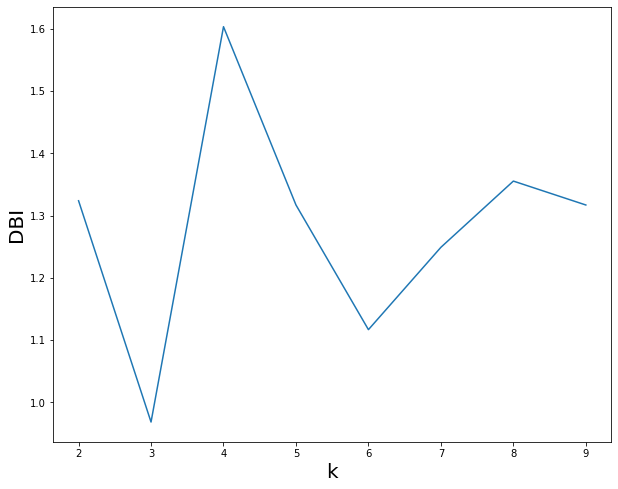

In [175]:
from sklearn.cluster import AgglomerativeClustering

ac = AgglomerativeClustering().fit(X)

pred = np.array([])
k = np.arange(2, 10, 1)
for i in k:
    ac.set_params(n_clusters=i)
    ac.fit(X)

    pred = np.append(pred, davies_bouldin_score(X, ac.labels_))

plt.figure(figsize=(10,8))
plt.xlabel('k', fontsize='20')
plt.ylabel('DBI', fontsize='20')
plt.plot(k, pred);

We use 6 clusters instead of 3 for compatibility with the previous model

In [177]:
ac_k = 6

In [178]:
ac = AgglomerativeClustering(n_clusters=ac_k).fit(X)
ac.labels_

array([3, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 5, 3, 0, 1, 3, 3, 1, 2, 0, 0,
       1, 3, 0, 1, 0, 3, 0, 0, 1, 1, 0, 0, 0, 1, 0, 3, 1, 2, 0, 1, 3, 4,
       1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 3, 1, 0, 1, 0, 3, 3, 0, 3, 0, 1, 0, 0, 0, 0])

Add labels to the primary dataset

In [180]:
df['acLabels'] = ac.labels_
df

,Neighbourhood,Latitude,Longitude,NeighbourhoodID,kmLabels,acLabels
0,Fourth Ward,29.75762,-95.38449,0,0,3
1,Greater Uptown,29.76015,-95.47671,1,1,0
2,Greater Inwood,29.86977,-95.48044,2,5,1
3,Greater Hobby Area,29.62949,-95.27848,3,1,0
4,Eldridge / West Oaks,29.75795,-95.63097,4,5,1
...,...,...,...,...,...,...
81,Meyerland Area,29.67944,-95.47349,83,5,1
82,Magnolia Park,29.73228,-95.29223,84,1,0
83,Afton Oaks / River Oaks Area,29.75190,-95.43282,85,5,0
84,Briarforest Area,29.74768,-95.57424,86,5,0


Display the clustering results in different colors on the map

In [181]:
c_map = folium.Map(location = [29.7633, -95.3633], zoom_start=12)

# clusters colors
x = np.arange(ac_k)
ys = [i+x+(i*x)**2 for i in range(ac_k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# rendering of clustering markers
for lat, lon, nei, cluster in zip(df['Latitude'], df['Longitude'], df['Neighbourhood'], df['acLabels']):
    label = folium.Popup(str(nei) + ', Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(c_map)

folium.CircleMarker(
    popup=f'Houston Center',
    tooltip=f'Houston Center',
    location=[29.7564, -95.3632],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(c_map)

c_map

Now it is necessary to determine in which clusters both algorithms performed the partition in the same way. This will indicate that at such points clustering was more successful and they are actually similar to each other in the frequency distribution of the number of stores.

In [182]:
df['kmLabels'].value_counts()

5    41
1    26
3    13
0     3
2     2
4     1
Name: kmLabels, dtype: int64

In [183]:
df['acLabels'].value_counts()

0    40
1    30
3    12
2     2
5     1
4     1
Name: acLabels, dtype: int64

It can be seen that the labels of the clusters do not match, therefore, we find the equivalent clusters and the number of matching points.

In [184]:
res = []
for i_ac in range(ac_k):
    for i_km in range(km_k):
        res.append((i_ac, i_km, df[(df['acLabels'] == i_ac) & 
                                   (df['kmLabels'] == i_km)].shape[0]))

res.sort(key=lambda t: t[2], reverse=True)

i = 0
cluster_mapping = []
while res[i][2] > 0: 
    cluster_mapping.append(res[i])
    i += 1

cross_df = pd.DataFrame(cluster_mapping, columns=('acLabel', 'kmLabel', 'Count'))
cross_df = cross_df[cross_df['acLabel'].duplicated() == False]
cross_df

,acLabel,kmLabel,Count
0,1,5,27
1,0,1,26
3,3,3,11
5,2,2,2
8,4,4,1
9,5,0,1


These are the clusters that are really similar to each other with a different clustering method. Let's display these marks on the map.

In [185]:
eq_cluster = 0
for label in cross_df.index:
    eq_cluster |= (df['acLabels'] == cross_df.loc[label, 'acLabel']) & (df['kmLabels'] == cross_df.loc[label, 'kmLabel'])

In [187]:
map_df = df[eq_cluster]

c_map = folium.Map(location = [29.7633, -95.3633], zoom_start=11)

def style_function(feature):
    return { 'color': 'grey', 'fill': False }

folium.GeoJson('houston.geojson', style_function=style_function, name='geojson').add_to(c_map)

# clusters colors
x = np.arange(km_k)
ys = [i+x+(i*x)**2 for i in range(km_k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# rendering of clustering markers
for lat, lon, nei, cluster in zip(map_df['Latitude'], map_df['Longitude'], map_df['Neighbourhood'], map_df['kmLabels']):
    label = folium.Popup(str(nei) + ', Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(c_map)

folium.CircleMarker(
    popup=f'Houston Center',
    tooltip=f'Houston Center',
    location=[29.7564, -95.3632],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(c_map)

c_map.save('cluster_map.html')
c_map

In [3]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url="https://raw.githubusercontent.com/poop-hub/Coursera_Capstone/main/png/cluster_map.png")

You can trust these two clusters to be clustered correctly with a high probability. Next, we will look at the distributions for each cluster. And we will determine what type of store can be opened in one of these areas.

Find the prevalence of stores in the 5th cluster

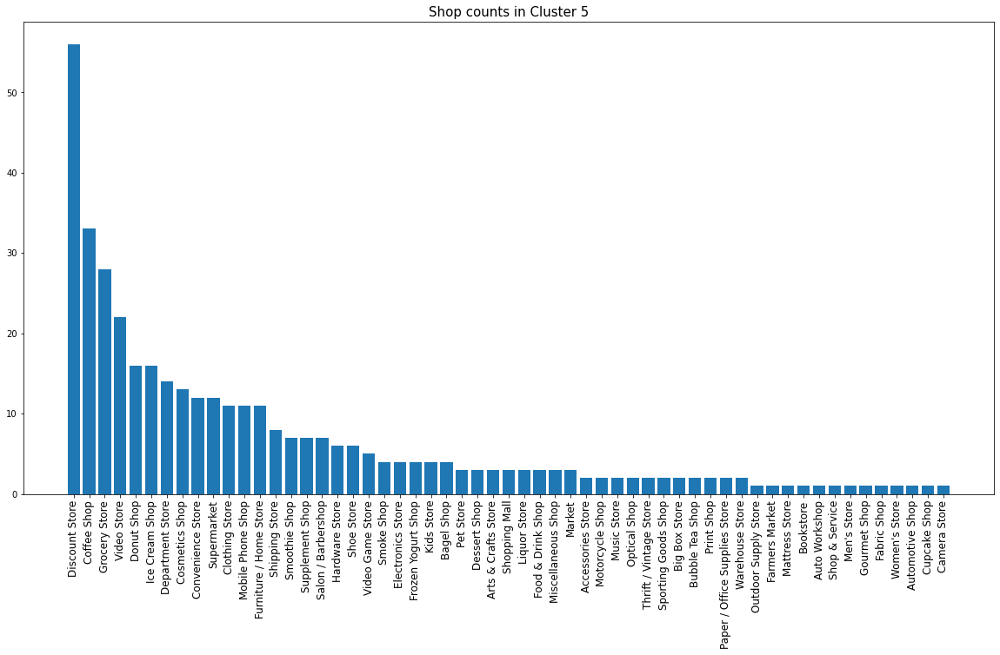

In [188]:
map1_df = df[(df['acLabels'] == cross_df.loc[0, 'acLabel']) & 
             (df['kmLabels'] == cross_df.loc[0, 'kmLabel'])]

shop_counts1 = ven_shop_df[ven_shop_df['Neighbourhood'].isin(map1_df['Neighbourhood'])]['Venue Category'].value_counts()

plt.figure(figsize=(20, 10))
plt.bar(range(len(shop_counts1)), shop_counts1.values, align='center')
plt.yticks(size='medium')
plt.xticks(range(len(shop_counts1)), shop_counts1.index.values, size='large', rotation=90)
plt.title('Shop counts in Cluster ' + str(cross_df.loc[0, 'kmLabel']), fontsize=15)
plt.show()

the prevalence of stores in the 1st cluster

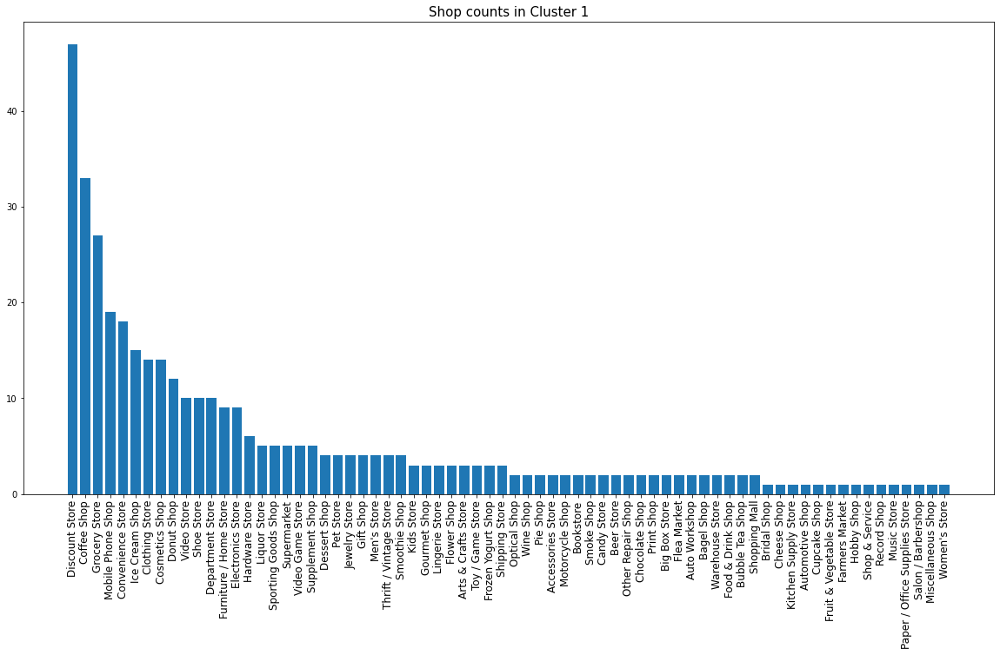

In [189]:
map2_df = df[(df['acLabels'] == cross_df.loc[1, 'acLabel']) & 
             (df['kmLabels'] == cross_df.loc[1, 'kmLabel'])]

shop_counts2 = ven_shop_df[ven_shop_df['Neighbourhood'].isin(map2_df['Neighbourhood'])]['Venue Category'].value_counts()

plt.figure(figsize=(20, 10))
plt.bar(range(len(shop_counts2)), shop_counts2.values, align='center')
plt.yticks(size='medium')
plt.xticks(range(len(shop_counts2)), shop_counts2.index.values, size='large', rotation=90)
plt.title('Shop counts in Cluster ' + str(cross_df.loc[1, 'kmLabel']), fontsize=15)
plt.show()

The prevalence of stores in the 3rd cluster

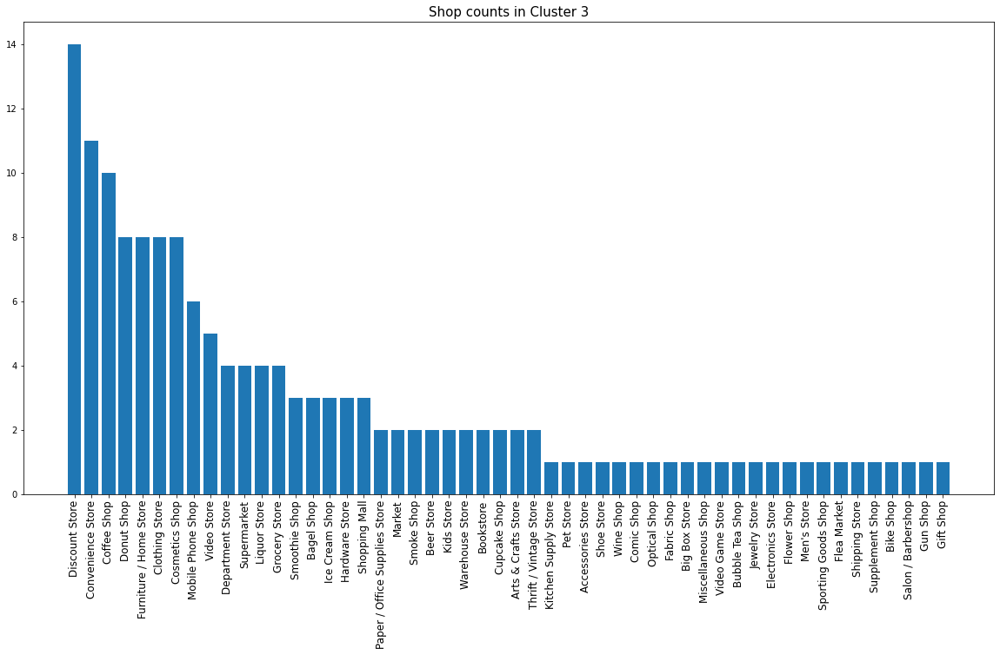

In [190]:
map3_df = df[(df['acLabels'] == cross_df.loc[3, 'acLabel']) & 
             (df['kmLabels'] == cross_df.loc[3, 'kmLabel'])]

shop_counts3 = ven_shop_df[ven_shop_df['Neighbourhood'].isin(map3_df['Neighbourhood'])]['Venue Category'].value_counts()

plt.figure(figsize=(20, 10))
plt.bar(range(len(shop_counts3)), shop_counts3.values, align='center')
plt.yticks(size='medium')
plt.xticks(range(len(shop_counts3)), shop_counts3.index.values, size='large', rotation=90)
plt.title('Shop counts in Cluster ' + str(cross_df.loc[3, 'kmLabel']), fontsize=15)
plt.show()

We see that the stores in all clusters are exponentially distributed. The largest number of stores corresponds to large chains. In cluster 3, there is a large number of second-hand shops, which may indicate that poor residents live in such areas or come here from other areas. We see that in the 1st cluster mobile phone shops are widespread, in other clusters they are less widespread. Let's consider the numerical indicators.

In [191]:
# 5th cluster
shop_counts1[:10]/shop_counts1[:10].sum()

Discount Store       0.252252
Coffee Shop          0.148649
Grocery Store        0.126126
Video Store          0.099099
Donut Shop           0.072072
Ice Cream Shop       0.072072
Department Store     0.063063
Cosmetics Shop       0.058559
Convenience Store    0.054054
Supermarket          0.054054
Name: Venue Category, dtype: float64

In [192]:
# 1st cluster
shop_counts2[:10]/shop_counts2[:10].sum()

Discount Store       0.224880
Coffee Shop          0.157895
Grocery Store        0.129187
Mobile Phone Shop    0.090909
Convenience Store    0.086124
Ice Cream Shop       0.071770
Clothing Store       0.066986
Cosmetics Shop       0.066986
Donut Shop           0.057416
Video Store          0.047847
Name: Venue Category, dtype: float64

In [193]:
# 3rd cluster
shop_counts3[:10]/shop_counts3[:10].sum()

Discount Store            0.170732
Convenience Store         0.134146
Coffee Shop               0.121951
Donut Shop                0.097561
Furniture / Home Store    0.097561
Clothing Store            0.097561
Cosmetics Shop            0.097561
Mobile Phone Shop         0.073171
Video Store               0.060976
Department Store          0.048780
Name: Venue Category, dtype: float64

We can see that discounters are common across all clusters. Coffee shops are just as common. Grocery stores are not common in cluster 3. Mobile phone stores are distributed in 1 cluster. It is also seen that clusters 1 and 5 are very similar to each other. There are approximately the same number of discounters, coffee shops and groceries. Thus, it can be assumed that the lack of mobile phone stores in cluster 5 may be an existing niche.

### 5. Determining the type and location for opening a store

To determine the solvency of city residents, we will consider the richest and most promising areas this year. This information can be obtained from https://www.homesnacks.com/best-neighborhoods-in-houston-tx/. Let's load a data table with promising areas.

In [194]:
top_df = pd.read_csv('Best Houston Neighbourhood.csv')

We will find the coordinates of these areas for display on the map and search for areas closest to them.

In [61]:
best_ll = [get_latlng(nh) for nh in top_df['Neighbourhood']]

In [196]:
# top_df.to_csv('top_df.csv', index=False)
top_df = pd.read_csv('top_df.csv')

In [197]:
top_df[:10]

,Rank,Neighbourhood,Population,Home Value,Median Income,Latitude,Longitude
0,1,West University,34360,"$759,119","$165,516",29.714932,-95.429841
1,2,Greater Memorial,35799,"$850,504","$143,470",29.772630,-95.570920
2,3,Rice,16664,"$600,800","$131,929",29.717365,-95.422715
3,4,Rice Military,23452,"$382,779","$118,360",29.761776,-95.419443
4,5,Galleria-Uptown,67996,"$406,118","$90,760",29.742630,-95.450565
5,6,Midtown,6409,"$230,220","$80,524",29.741550,-95.376870
6,7,River Oaks,31337,"$623,948","$130,337",29.751401,-95.426567
7,8,Downtown,10089,"$63,900","$114,810",29.756260,-95.356560
8,9,Montrose,35723,"$378,377","$85,791",29.759407,-95.392390
9,10,Greater Heights,57943,"$362,028","$95,610",29.796250,-95.394870


Find the center point for these areas and build a map of the best areas.

In [198]:
top_lat = top_df[:10][['Latitude', 'Longitude']].median()[0]
top_lon = top_df[:10][['Latitude', 'Longitude']].median()[1]
top_map = folium.Map(location = [top_lat, top_lon], zoom_start=12)

folium.Choropleth(
    geo_data='houston.geojson',
    data=df,
    columns=['Neighbourhood','NeighbourhoodID'],
    key_on='properties.name',
    fill_color='Paired',
    fill_opacity=0.5,
    legend_name="Top Neighborhoods of Houston",
    line_opacity=0.2,
    threshold_scale=12,
    highligth=True
    ).add_to(top_map)

for lat, lon, nb in zip(df['Latitude'], df['Longitude'], df['Neighbourhood']):
    folium.CircleMarker(
        tooltip=nb,
        location=[lat, lon],
        popup=f'{nb}',
        radius=5,
        color='grey',
        fill_color='grey',
        fill=True,
        fill_opacity=0.4,
        opacity=0.4
    ).add_to(top_map)

for lat, lon, nb in zip(top_df[:10]['Latitude'], top_df[:10]['Longitude'], top_df[:10]['Neighbourhood']):
    folium.CircleMarker(
        tooltip=nb,
        location=[lat, lon],
        popup=f'{nb}',
        radius=7,
        color='green',
        fill_color='green',
        fill=True,
        fill_opacity=0.7,
        opacity=0.7
    ).add_to(top_map)

folium.CircleMarker(
    popup=f'Houston Center',
    tooltip=f'Houston Center',
    location=[29.7564, -95.3632],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(top_map)

folium.CircleMarker(
    popup=f'Top Center',
    tooltip=f'Top Center',
    location=[top_lat, top_lon],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(top_map)

top_map.save('top_map.html')
top_map

In [4]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url="https://raw.githubusercontent.com/poop-hub/Coursera_Capstone/main/png/top_map.png")

We can see that the best neighbourhoods are located west of the city center, with their median center located at River Oaks. It will most likely be impossible to open a store in the very center of this area due to the rental cost or because of the closedness of the area. Therefore, we will find the closest areas to these. It is logical to assume that residents will tend to live closer to good areas, so they will occupy nearby areas of the city. You can open a shop in one of these places. Find the nearest neighborhoods using the nearest neighbors model.

In [199]:
from sklearn.neighbors import NearestNeighbors
X1 = df[['Latitude', 'Longitude']]
X2 = top_df[:10][['Latitude', 'Longitude']]

nn = NearestNeighbors(10)
nn.fit(X1)

_, nn_ix = nn.kneighbors(np.array([top_lat, top_lon]).reshape(1, -1))
nn_ix

array([[83, 85, 19,  0, 75, 33, 21, 34, 49,  1]])

We will find the most common shops in these areas.

In [200]:
area_df = df.loc[nn_ix[0]]
area_df

,Neighbourhood,Latitude,Longitude,NeighbourhoodID,kmLabels,acLabels
83,Afton Oaks / River Oaks Area,29.75190,-95.43282,85,5,0
85,Neartown - Montrose,29.74281,-95.39728,87,1,0
19,Greenway / Upper Kirby Area,29.73250,-95.44144,20,2,2
0,Fourth Ward,29.75762,-95.38449,0,0,3
75,University Place,29.71949,-95.40643,77,5,0
33,Lazy Brook / Timbergrove,29.79684,-95.43404,35,1,0
21,Midtown,29.74155,-95.37687,22,5,0
34,Greater Heights,29.79625,-95.39487,36,1,0
49,Medical Center Area,29.71179,-95.39315,51,5,1
1,Greater Uptown,29.76015,-95.47671,1,1,0


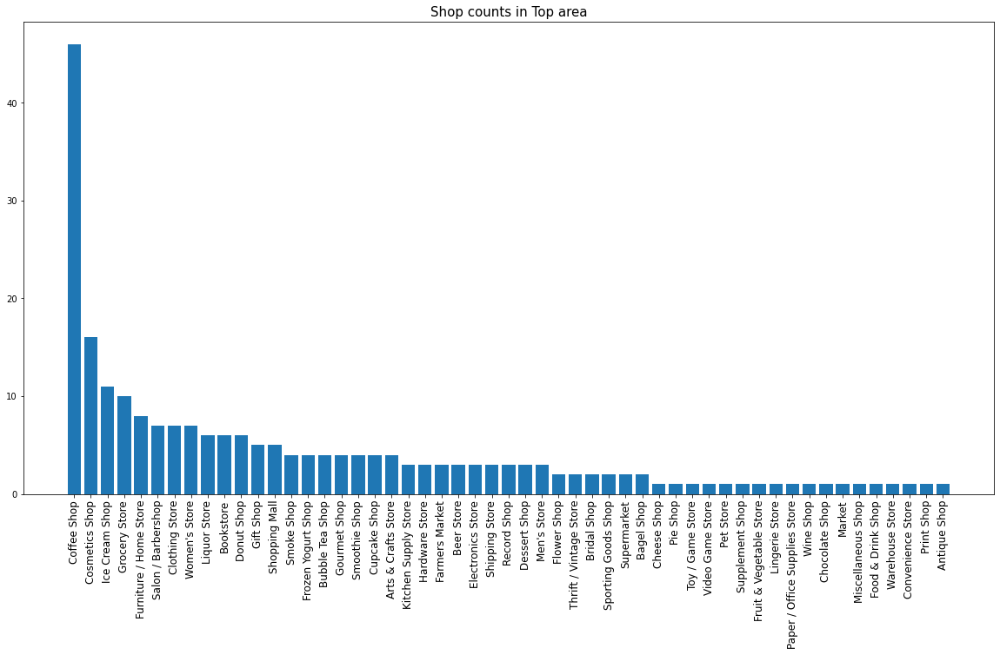

In [201]:
area_shop_counts = ven_shop_df[ven_shop_df['Neighbourhood'].isin(area_df['Neighbourhood'])]['Venue Category'].value_counts()

plt.figure(figsize=(20, 10))
plt.bar(range(len(area_shop_counts)), area_shop_counts.values, align='center')
plt.yticks(size='medium')
plt.xticks(range(len(area_shop_counts)), area_shop_counts.index.values, size='large', rotation=90)
plt.title('Shop counts in Top area', fontsize=15)
plt.show()

It can be seen that mobile phone shops are not widespread in the western part of the city. Let's build a map of the area in which stores can be opened.

In [202]:
ven_area_df = ven_shop_df[ven_shop_df['Neighbourhood'].isin(area_df['Neighbourhood'])]
phone_df = ven_shop_df[(ven_shop_df['Venue Category'] == 'Mobile Phone Shop')]
phone_map = folium.Map(location = [top_lat, top_lon], zoom_start=11)

def style_function(feature):
    return { 'color': 'grey', 'fill': False }

folium.GeoJson('houston.geojson', style_function=style_function, name='geojson').add_to(venue_map)

for lat, lon, ven in zip(ven_area_df['Venue Latitude'], ven_area_df['Venue Longitude'], ven_area_df['Venue']):
    label = '{}'.format(ven)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7).add_to(phone_map)

for lat, lon, ven in zip(phone_df['Venue Latitude'], phone_df['Venue Longitude'], phone_df['Venue']):
    label = '{}'.format(ven)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='green',
        fill_opacity=0.7).add_to(phone_map)

folium.CircleMarker(
    popup=f'Houston Center',
    tooltip=f'Houston Center',
    location=[29.7564, -95.3632],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(top_map)

folium.CircleMarker(
    popup=f'Top Center',
    tooltip=f'Top Center',
    location=[top_lat, top_lon],
    radius=5,
    color='black',
    fill_color='black',
    fill=True,
    fill_opacity=1
).add_to(phone_map)

folium.CircleMarker(
    location=[top_lat, top_lon],
    radius=100,
    color='white',
    # fill_color='black',
    # fill=True,
    fill_opacity=1
).add_to(phone_map)

phone_map.save('phone_map.html')
phone_map

In [5]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url="https://raw.githubusercontent.com/poop-hub/Coursera_Capstone/main/png/phone_map.png")

As you can see, there are a large number of shops in the desired area. It follows from this that there is an opportunity to build stores there and it is profitable. However, mobile phone shops are located outside the desired area. Therefore mobile phone shop can be opened in one of the surrounding areas.

## Results and Discussion <a name="results"></a>

Our analysis showed that there is a large number of establishments in Houston. A large number of stores are chain stores. The most common stores are Discount Shop, Coffee Shop, Grocery Shop. There are prosperous, high-income areas in the city. In the vicinity of these areas, you can build shops that are not found in these areas due to certain circumstances. We found out that one of the promising stores to open are mobile phone stores. Currently, most of the inhabitants of developed cities have a mobile phone and this trend is positive. In developed areas, such shops do not meet, which may not be very convenient for wealthy residents. Thus, opening a store in one of the areas close to prosperous is a promising business start. We found that such areas are located to the west of the city center and many of them are clustered in a similar way, which suggests that the consumer interests of citizens are approximately similar. That is, citizens from areas where there are no mobile phone stores may be inclined to shop in such stores as citizens in areas similar to this.

## Conclusion <a name="conclusion"></a>

The goal of this project was to identify the type of store and its approximate location in a promising area of the city of Houston for stakeholders. Using open sources of data, we created datasets that helped identify patterns in the data. Data clustering made it possible to identify similar areas by the contingent of buyers. As a result, we identified a possible store location to the west of the city center and decided that it would be optimal to open a mobile phone store there.